# CDSDS 542 Sp2026 - Discussion 13: Using Pre-trained Model

[![](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/DL4DS/sp2026_discussions/blob/main/discussion_13.ipynb)

# 1. ControlNet
![image](https://raw.githubusercontent.com/lllyasviel/ControlNet/main/github_page/he.png)

ControlNet is a method for adding **conditional structural control** to text-to-image diffusion models such as Stable Diffusion. It enables you to guide generation with inputs like Canny edges, depth maps, segmentation maps, or human poses.


ControlNet trains an additional network that learns to interpret a conditioning input (e.g., an edge map) while preserving the original diffusion model's capabilities.

**Architecture Components for Stable Diffusion - ControlNet:**

* **Frozen copy** of the original diffusion model → protects pretrained knowledge.
* **Trainable copy** of the U-Net encoder → learns how to use conditional input.
* **Zero Convolutions** connecting the two copies → start as zeros; gradually learn residual corrections.

![image](https://raw.githubusercontent.com/lllyasviel/ControlNet/main/github_page/sd.png)




# 2. Example

Using: https://github.com/lllyasviel/ControlNet/tree/main

In [1]:
# modules
!pip install diffusers transformers accelerate controlnet_aux opencv-python -q

import cv2
import numpy as np
import matplotlib.pyplot as plt

import requests
from io import BytesIO
from PIL import Image

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.4/290.4 kB 7.4 MB/s eta 0:00:00


**Edge**

(np.float64(-0.5), np.float64(218.5), np.float64(230.5), np.float64(-0.5))

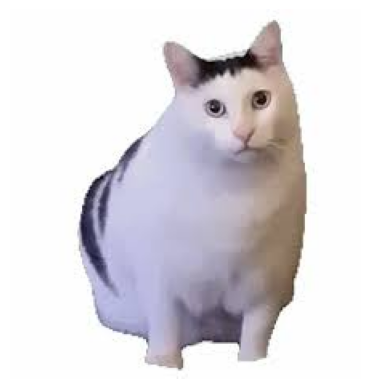

In [2]:
response = requests.get("https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQJ_DCgCwy0fddxnCLvoBaGifVwKKmq28hKJw&s")
input_image = Image.open(BytesIO(response.content)).convert("RGB")
plt.imshow(input_image, cmap='gray')
plt.axis('off')

/usr/local/lib/python3.12/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.12/dist-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/usr/local/lib/python3.12/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segmen

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

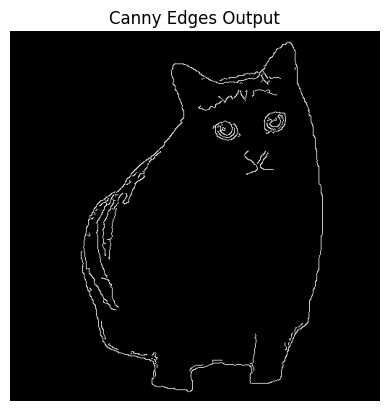

In [3]:
from controlnet_aux import CannyDetector

canny_detector = CannyDetector()
edges = canny_detector(input_image).convert("RGB")

plt.title("Canny Edges Output")
plt.imshow(edges, cmap='gray')
plt.axis('off')

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recomme

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/500 [00:00<?, ?it/s]

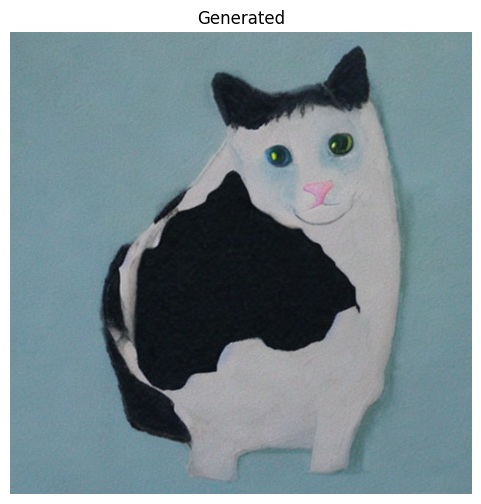

In [4]:
import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

edges_PIL = edges.convert("RGB")

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
         "runwayml/stable-diffusion-v1-5",
         controlnet=controlnet,
         torch_dtype=torch.float16
       ).to("cuda")
prompt = "a carton cow cat"


result = pipe(prompt, image=edges_PIL, num_inference_steps=500)
gen = result.images[0]

plt.figure(figsize=(6,6))
plt.imshow(gen)
plt.axis("off")
plt.title("Generated")
plt.show()

**Depth map**

dpt_hybrid-midas-501f0c75.pt:   0%|          | 0.00/493M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/timm/models/_factory.py:138: UserWarning: Mapping deprecated model name vit_base_resnet50_384 to current vit_base_r50_s16_384.orig_in21k_ft_in1k.
  model = create_fn(


(np.float64(-0.5), np.float64(511.5), np.float64(703.5), np.float64(-0.5))

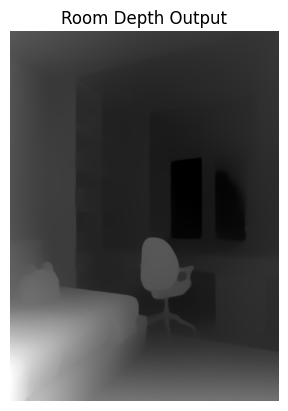

In [5]:
from controlnet_aux import MidasDetector

response = requests.get("https://raw.githubusercontent.com/lllyasviel/ControlNet/main/test_imgs/room.png")
room_image = Image.open(BytesIO(response.content)).convert("RGB")

midas = MidasDetector.from_pretrained("lllyasviel/Annotators")
depth = midas(room_image)

plt.title("Room Depth Output")
plt.imshow(depth)
plt.axis('off')

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/200 [00:00<?, ?it/s]

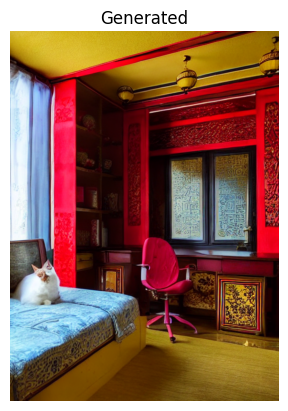

In [6]:
controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-depth", torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
         "runwayml/stable-diffusion-v1-5",
         controlnet=controlnet,
         torch_dtype=torch.float16
       ).to("cuda")
prompt = "a golden chinese-style room, with a cat on the bed, sunny outside the window"

result = pipe(prompt, image=depth, num_inference_steps=200)
gen = result.images[0]

plt.imshow(gen)
plt.axis("off")
plt.title("Generated")
plt.show()

**Human Pose**

In [8]:
from controlnet_aux import OpenposeDetector

response = requests.get("https://scontent-bos5-1.cdninstagram.com/v/t51.2885-19/307848328_448645750571208_2939090749819440312_n.jpg?stp=dst-jpg_s150x150_tt6&efg=eyJ2ZW5jb2RlX3RhZyI6InByb2ZpbGVfcGljLmRqYW5nby4xMDgwLmMyIn0&_nc_ht=scontent-bos5-1.cdninstagram.com&_nc_cat=100&_nc_oc=Q6cZ2QHAsz8M_nHLaRENYwLqhNQjUXmJ82xf7eVKjjV9YTsvIgwljtRu_bp84OHKVSCvMNmbwOwEFsTXNBb8eyJ63Gyb&_nc_ohc=O7M6EngUM_oQ7kNvwHnEwXi&_nc_gid=K4l84A33SDfXs5d-plNl-A&edm=AP4sbd4BAAAA&ccb=7-5&oh=00_AfkOv1oGufuENj7-Xw0t1S1pBsawR3-Pf1iZ3SwppGVBIg&oe=6935786B&_nc_sid=7a9f4b")
pose_image = Image.open(BytesIO(response.content)).convert("RGB")

pose_detector = OpenposeDetector.from_pretrained("lllyasviel/Annotators")
pose = pose_detector(pose_image)

plt.figure(figsize=(8,4))
plt.title("Pose Output")
plt.imshow(pose)
plt.axis('off')

UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7ca2cf002b60>

In [9]:
controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
         "runwayml/stable-diffusion-v1-5",
         controlnet=controlnet,
         torch_dtype=torch.float16
       ).to("cuda")
prompt = "a man in suit wearing sunglasses sitting in a cafe"

result = pipe(prompt, image=pose, num_inference_steps=500)
gen = result.images[0]

plt.figure(figsize=(6,6))
plt.imshow(gen)
plt.axis("off")
plt.title("Generated")
plt.show()

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


NameError: name 'pose' is not defined

# 3. Exercise
![image](https://i.redd.it/xvv422i01zcd1.png)

### TODO:
   **Take a photo of someone in our class, and use your own prompt to generate an image that matches their pose, edges, or any features you want to preserve! (You may choose any models you would like for the condition. Besides, you are also free to experiment with different diffusion models if you prefer.)**



In [10]:
# example for detectors that you can use
print([name for name in dir(controlnet_aux) if "Detector" in name])

NameError: name 'controlnet_aux' is not defined

In [11]:
# TODO: define the detector
from controlnet_aux import CannyDetector
my_detector = CannyDetector()

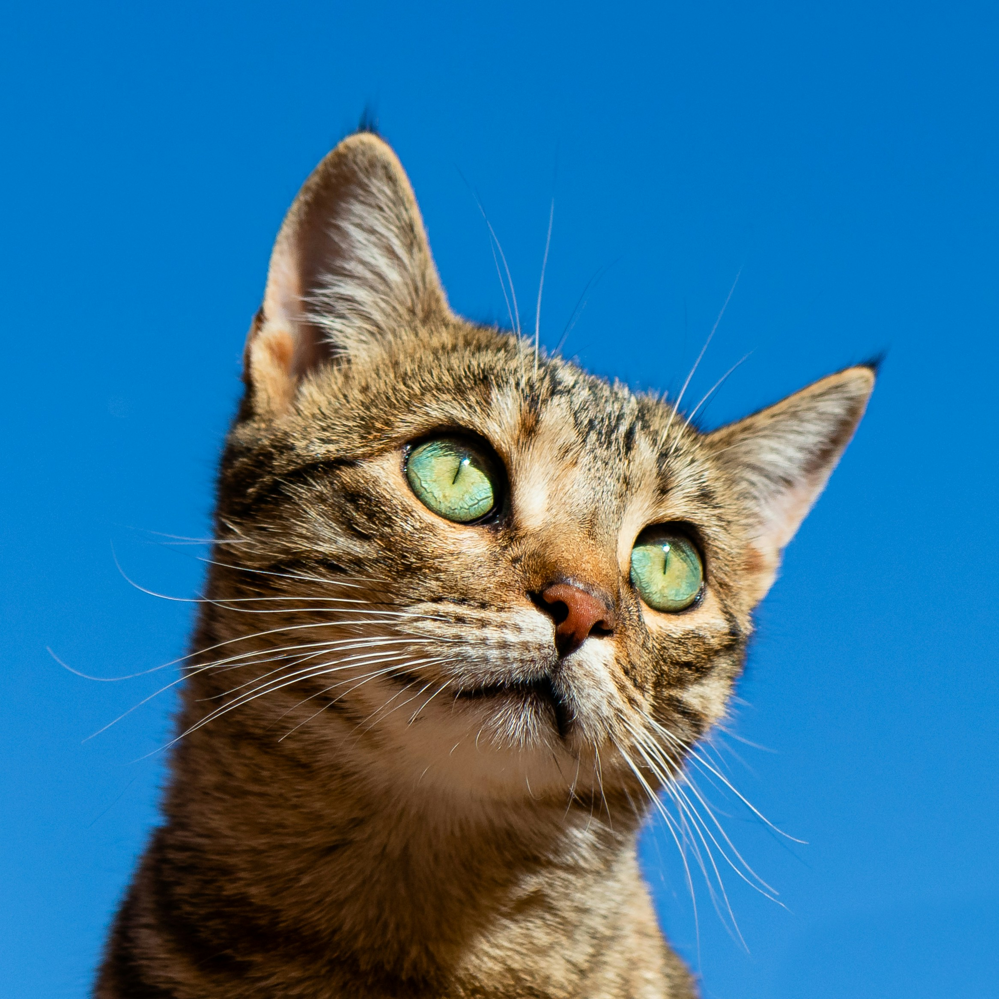

In [12]:
# TODO: load the image that you choose
import requests
from PIL import Image
from io import BytesIO

url = "https://images.unsplash.com/photo-1574158622682-e40e69881006"
my_image = Image.open(BytesIO(requests.get(url).content)).convert("RGB")

my_image

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

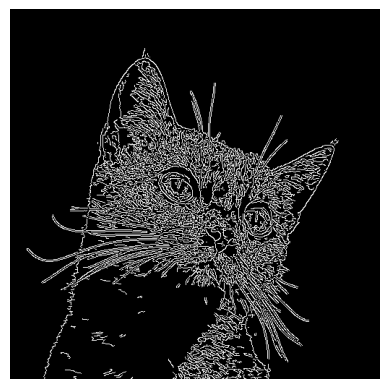

In [13]:
# TODO: get the preserved feature
my_feature_img = my_detector(my_image).convert("RGB")

plt.imshow(my_feature_img)

plt.axis("off")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/50 [00:00<?, ?it/s]

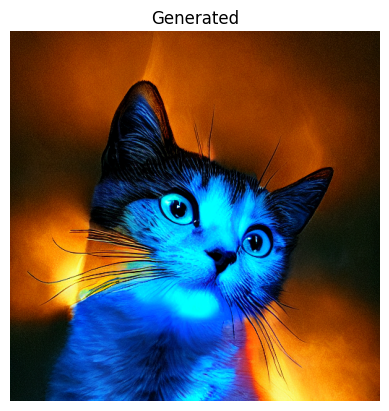

In [14]:
# TODO: complete the pipeline
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch.float16
)

pipe =StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet,
    torch_dtype=torch.float16
).to("cuda")


prompt = "a majestic fantasy cat made of fire, glowing, cinematic lighting"

result = pipe(
    prompt,
    image=my_feature_img,
    num_inference_steps=50
)

gen = result.images[0]

plt.imshow(gen)
plt.axis("off")
plt.title("Generated")
plt.show()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/50 [00:00<?, ?it/s]

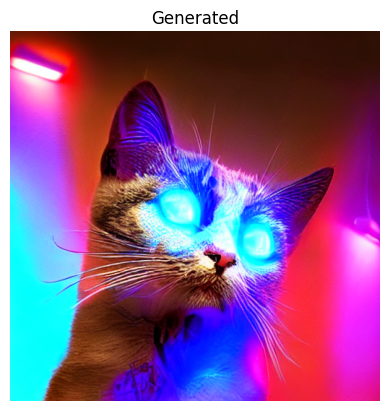

In [15]:
# TODO: complete the pipeline
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch.float16
)

pipe =StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet,
    torch_dtype=torch.float16
).to("cuda")


prompt = "a cyberpunk robotic cat with neon lights, ultra detailed"

result = pipe(
    prompt,
    image=my_feature_img,
    num_inference_steps=50
)

gen = result.images[0]

plt.imshow(gen)
plt.axis("off")
plt.title("Generated")
plt.show()

Reference:
- https://github.com/lllyasviel/ControlNet/discussions/188
- https://github.com/lllyasviel/ControlNet/tree/main
- https://dl4ds.github.io/fa2025/static_files/lectures/24_pretrained.pdf